In [55]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import librosa
from sklearn.ensemble import RandomForestClassifier  # Per la classificazione
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
import joblib # For save a model
import time

In [2]:
# Load the .npy file
data = np.load("development.npy")

In [3]:
# Load labels from CSV file "development.csv"
labels_df = pd.read_csv("development.csv")

In [4]:
#Load features from CSV file "idx_to_feature_name.csv"
feature_df = pd.read_csv("idx_to_feature_name.csv")

In [5]:
#Take only one row of the data; only one recording
audio = data[2]

In [6]:
bandwidth = audio[0, :]
centroid = audio[1,:]
contrast = audio[2:8,0]
energy = audio[9,:]
flatness = audio[10,:]
flux = audio[11, :]
melspect = audio[12:75, :]
mfcc = audio[76:107,:]
mfcc_d = audio[108:139,:]
mfcc_d2 = audio[140:171,:]
power = audio[172, :]
yin = audio[173, :]
zcr = audio[174,:]

In [7]:
# Normalizza i valori delle features nell'intervallo [0, 1]
min_value = np.min(audio)
max_value = np.max(audio)
normalized_audio_array = (audio - min_value) / (max_value - min_value)

 # How to save the model

In [276]:
# Save the model
joblib.dump(model, 'random_forest_model.pkl')

['random_forest_model.pkl']

In [140]:
# Load the model
model = joblib.load('random_forest_model.pkl')

# Dataset

In [6]:
print("Dimension array: ", data.shape)
print("Snippet: ", data.shape[0])
print("Features: ", data.shape[1])
print("Frames: ", data.shape[2])

Dimension arrey:  (45296, 175, 44)
Snippet:  45296
Features:  175
Frames:  44


In [13]:
# Accesso ai dati
# Ad esempio, se vuoi accedere alla prima riga di dati:
first_row = data[2]
print(first_row)
print("First row shape:", data[0].shape)

[[2.84029280e+03 2.73157101e+03 2.58382351e+03 ... 1.56376760e+03
  1.51011626e+03 1.52985212e+03]
 [3.89266201e+03 4.34801346e+03 4.26780955e+03 ... 9.13483519e+02
  7.88928442e+02 7.94855506e+02]
 [1.44627491e+01 2.58025413e+00 8.42772024e+00 ... 5.40193474e+00
  4.55107096e+00 6.40180648e+00]
 ...
 [4.10812736e-01 4.79765892e+00 8.63443375e+00 ... 2.10097847e+01
  1.14827003e+01 1.07124186e+01]
 [3.84645105e+03 3.79872337e+03 3.83945351e+03 ... 1.68433238e+02
  1.72678262e+02 1.74780703e+02]
 [3.52500000e-01 5.05000000e-01 4.90000000e-01 ... 6.00000000e-02
  3.25000000e-02 2.75000000e-02]]
First row shape: (175, 44)


This is the first recording in the dataset, 1.1 s long. It is splitted in 44 ms frames. According to the _csv_ file this is the recording for the word Brotchen.

For this recording (and in general all recordings) we have 175 features.  

Per migliorare la comprensione lo convertiamo in un dataset, con le righe = features, le colonne = frames.

In [14]:
# For better visualization, the array of the  first recording is the following DataFrame
df = pd.DataFrame(first_row)
df.head()

,0,1,2,3,4,5,6,7,8,9,...,34,35,36,37,38,39,40,41,42,43
0,2840.292802,2731.571008,2583.823511,2653.939408,2758.208824,2986.179947,3101.841080,3176.543972,3016.110035,2623.352952,...,1048.545218,1226.320755,1178.300048,1586.190014,1862.326959,1631.545761,1630.927970,1563.767601,1510.116259,1529.852122
1,3892.662014,4348.013455,4267.809548,4312.717226,4685.061709,4941.189762,4616.798918,4364.911563,2994.651847,1970.141894,...,518.589877,517.165311,474.384080,586.321969,728.542545,760.461969,938.578126,913.483519,788.928442,794.855506
2,14.462749,2.580254,8.427720,8.723876,1.860670,4.471342,4.176024,12.507990,4.689169,3.977920,...,0.827049,4.672290,11.384732,10.227127,7.322105,5.949175,3.386780,5.401935,4.551071,6.401806
3,7.939964,2.623517,2.919069,3.672604,7.678183,4.130148,2.407593,5.264283,7.608086,11.190576,...,15.858031,9.683443,7.271828,5.528791,8.180420,4.917936,9.837276,11.846140,16.976057,11.980434
4,4.448498,10.506751,11.026715,7.807691,13.243044,7.883476,12.765173,9.535807,5.808673,11.298778,...,15.767165,9.161110,5.255630,8.980284,9.674289,12.321479,9.796242,11.098561,7.815431,8.058557


In [7]:
lables_df

,id,filename,speaker_id,word
0,0,words/Brötchen/1.wav,1,Brötchen
1,1,words/kann/1.wav,1,kann
2,2,words/Staubsauger/1.wav,1,Staubsauger
3,3,words/Spiegel/1.wav,1,Spiegel
4,4,words/Alarm/1.wav,1,Alarm
...,...,...,...,...
45291,45291,words/other/320_3_speech_true.wav,50,other
45292,45292,words/other/320_4_speech_true.wav,50,other
45293,45293,words/other/320_5_speech_true.wav,50,other
45294,45294,words/other/320_6_speech_true.wav,50,other


In [10]:
feature_df

,index,feature_name
0,0,bandwidth_0
1,1,centroid_0
2,2,contrast_0
3,3,contrast_1
4,4,contrast_2
...,...,...
170,170,mfcc_d2_30
171,171,mfcc_d2_31
172,172,power_0
173,173,yin_0


In [12]:
pd.set_option('display.max_rows', 200)
feature_df["feature_name"]

0      bandwidth_0
1       centroid_0
2       contrast_0
3       contrast_1
4       contrast_2
5       contrast_3
6       contrast_4
7       contrast_5
8       contrast_6
9         energy_0
10      flatness_0
11          flux_0
12      melspect_0
13      melspect_1
14      melspect_2
15      melspect_3
16      melspect_4
17      melspect_5
18      melspect_6
19      melspect_7
20      melspect_8
21      melspect_9
22     melspect_10
23     melspect_11
24     melspect_12
25     melspect_13
26     melspect_14
27     melspect_15
28     melspect_16
29     melspect_17
30     melspect_18
31     melspect_19
32     melspect_20
33     melspect_21
34     melspect_22
35     melspect_23
36     melspect_24
37     melspect_25
38     melspect_26
39     melspect_27
40     melspect_28
41     melspect_29
42     melspect_30
43     melspect_31
44     melspect_32
45     melspect_33
46     melspect_34
47     melspect_35
48     melspect_36
49     melspect_37
50     melspect_38
51     melspect_39
52     melsp

In [24]:
melspect = audio[12:75, :]
mfcc = audio[76:107,:]
mfcc_d = audio[108:139,:]
mfcc_d2 = audio[140:171,:]

## Plots

### Bad Plots

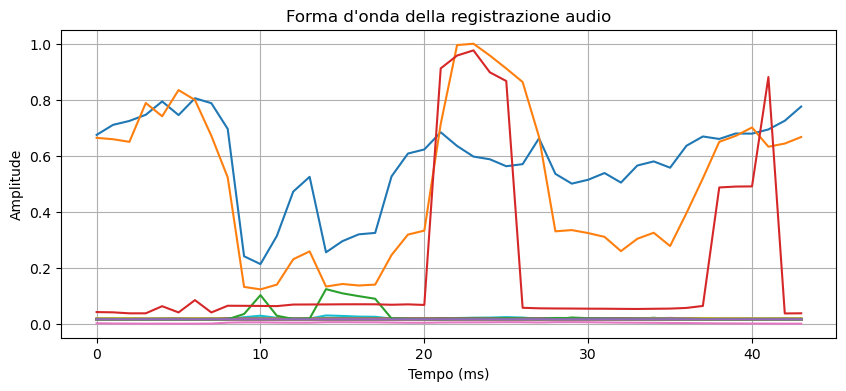

In [36]:
# Array NumPy che rappresenta la registrazione audio
audio = first_row
# Calcola la durata totale della registrazione in secondi
durata_registrazione = 1.1  # Durata totale della registrazione in secondi

# Calcola il tempo di campionamento (tasso di campionamento)
tasso_campionamento = durata_registrazione / audio.shape[1]

# Calcola il tempo totale dell'asse x (tempo in secondi)
tempo_totale = np.arange(audio.shape[1])

# Plotta la forma d'onda
plt.figure(figsize=(10, 4))
plt.plot(tempo_totale, audio.T)  # Trasponiamo l'array per avere le features come colonne
plt.title('Forma d\'onda della registrazione audio')
plt.xlabel('Tempo (ms)')
plt.ylabel('Amplitude')
plt.grid(True)
plt.show()

Waves con tutte le feature

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


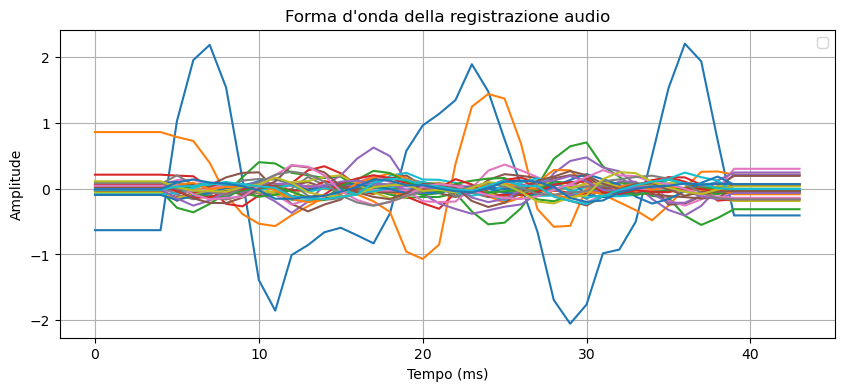

In [21]:
# Array NumPy che rappresenta la registrazione audio
audio = first_row
audio_subset = audio[108:139, :]
# Calcola la durata totale della registrazione in secondi
durata_registrazione = 1.1  # Durata totale della registrazione in secondi

# Calcola il tempo di campionamento (tasso di campionamento)
tasso_campionamento = durata_registrazione / audio.shape[1]

# Calcola il tempo totale dell'asse x (tempo in secondi)
tempo_totale = np.arange(audio.shape[1])

# Plotta la forma d'onda
plt.figure(figsize=(10, 4))
plt.plot(tempo_totale, mfcc_d2.T)  # Trasponiamo l'array per avere le features come colonne
plt.title('Forma d\'onda della registrazione audio')
plt.xlabel('Tempo (ms)')
plt.ylabel('Amplitude')
plt.grid(True)
plt.legend()
plt.show()

C:\Users\miche.LAPTOP-KKEENNGV\AppData\Local\Temp\ipykernel_24536\2165228557.py:16: UserWarning: Only one segment is calculated since parameter NFFT (=256) >= signal length (=44).
  plt.specgram(audio_feature, Fs=1/tasso_campionamento, cmap='viridis')


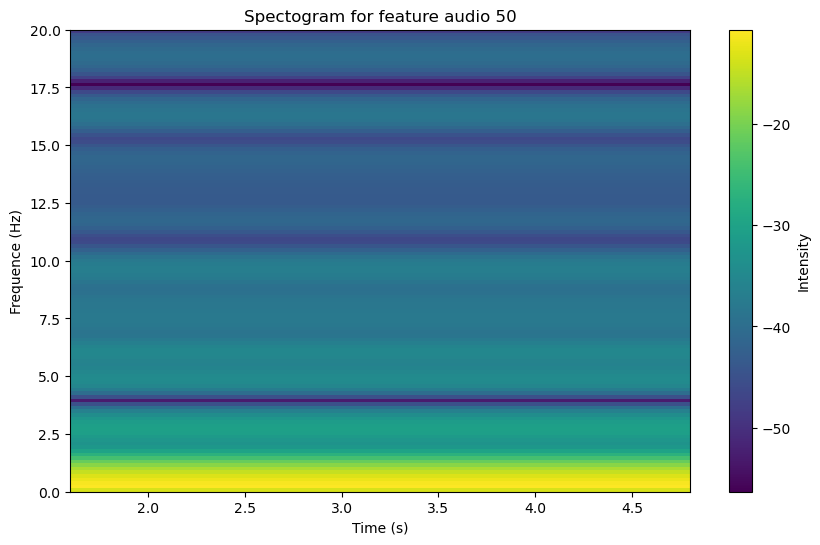

In [25]:
import matplotlib.pyplot as plt

# Seleziona la singola feature desiderata
feature_index = 50
# Modifica l'indice della feature desiderata
audio_feature = audio[feature_index]

# Calcola la durata totale della registrazione in secondi
durata_registrazione = 1.1  # Durata totale della registrazione in secondi

# Calcola il tempo di campionamento (tasso di campionamento)
tasso_campionamento = durata_registrazione / len(audio_feature)

# Genera lo spettrogramma per la singola feature
plt.figure(figsize=(10, 6))
plt.specgram(audio_feature, Fs=1/tasso_campionamento, cmap='viridis')
plt.title(f'Spectogram for feature audio {feature_index}')
plt.xlabel('Time (s)')
plt.ylabel('Frequence (Hz)')
plt.colorbar(label='Intensity')
plt.show()


### Spectogram following the rule at slides 6-8 presentation on data exploration

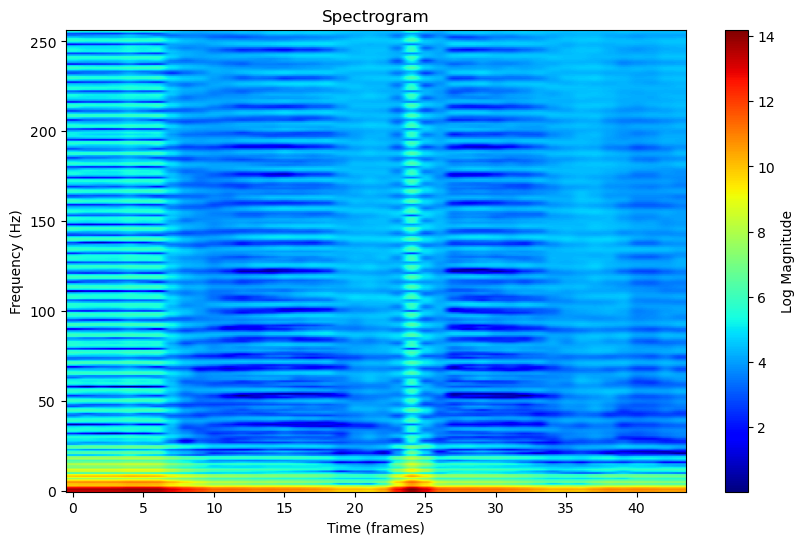

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import spectrogram

# Assuming 'audio' is your array

# Define parameters for the spectrogram
# You may need to adjust these parameters based on your audio sampling rate and frame size
# Here, we assume a sampling rate of 44.1 kHz and a frame size of 25 ms
sampling_rate = 44100  # Hz
frame_size = int(0.025 * sampling_rate)  # 25 ms
overlap = int(0.015 * sampling_rate)  # 15 ms
nfft = 512  # Number of FFT points

# Initialize an empty list to store spectrogram data
spectrogram_data = []

# Iterate through each column of 'audio'
for col in range(audio.shape[1]):
    # Compute spectrogram using scipy's spectrogram function
    #f, t, Sxx = spectrogram(audio[:, col], fs=sampling_rate, nperseg=frame_size, noverlap=overlap, nfft=nfft)
    f, t, Sxx = spectrogram(audio[:, col], nfft=nfft)

    # Stack the resulting frames
    spectrogram_data.append(Sxx)

# Stack the spectrogram frames along the time axis (axis=1)
stacked_spectrogram = np.hstack(spectrogram_data)

# Plot the spectrogram
plt.figure(figsize=(10, 6))
plt.imshow(np.log(stacked_spectrogram + 1), aspect='auto', cmap='jet', origin='lower')
plt.colorbar(label='Log Magnitude')
plt.xlabel('Time (frames)')
plt.ylabel('Frequency (Hz)')
plt.title('Spectrogram')
plt.show()


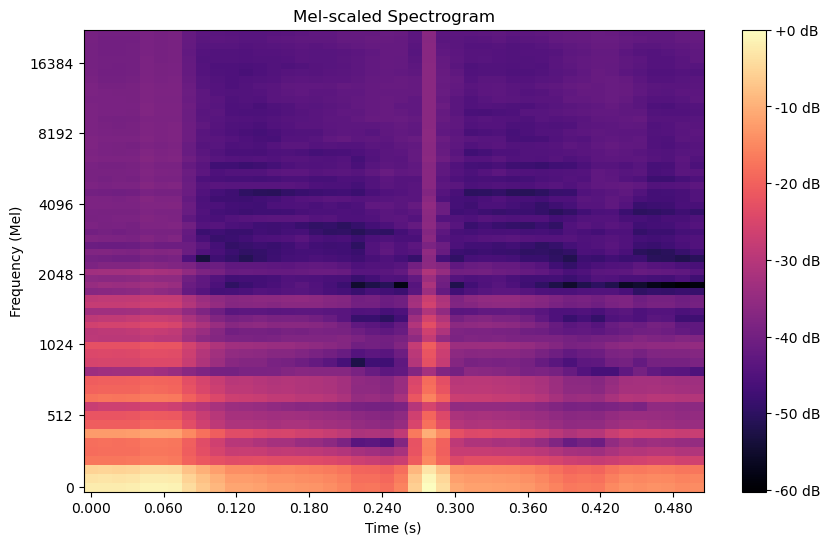

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import librosa.display
from scipy.signal import spectrogram

stacked_spectrogram = np.hstack(spectrogram_data)

# Remap the spectrogram to Mel scale with 64 bins
mel_stacked_spectrogram = librosa.feature.melspectrogram(S=stacked_spectrogram, sr=sampling_rate, n_mels=64)

# Convert to decibel scale (log scale) for visualization
mel_log_stacked_spectrogram = librosa.power_to_db(mel_stacked_spectrogram, ref=np.max)

# Plot the spectrogram
plt.figure(figsize=(10, 6))
librosa.display.specshow(mel_log_stacked_spectrogram, sr=sampling_rate, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Mel)')
plt.title('Mel-scaled Spectrogram')
plt.show()

## Work of 16/05

### Mel spectogram

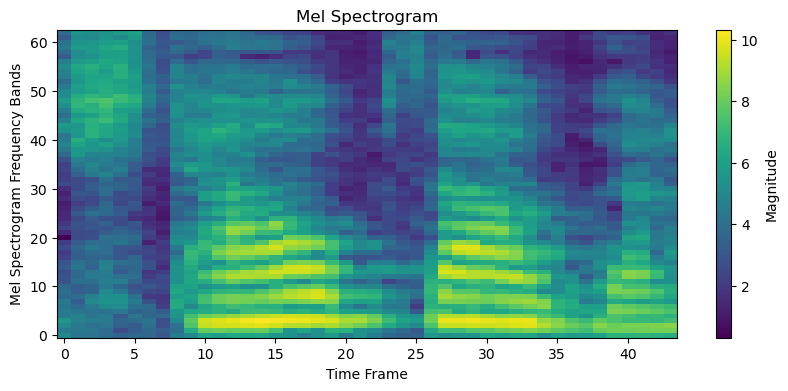

In [8]:
# Plotting the spectrogram
plt.figure(figsize=(10, 4))
plt.imshow(melspect, aspect='auto', origin='lower', cmap='viridis')
plt.colorbar(label='Magnitude')
plt.xlabel('Time Frame')
plt.ylabel('Mel Spectrogram Frequency Bands')
plt.title('Mel Spectrogram')
plt.show()

### MFCC

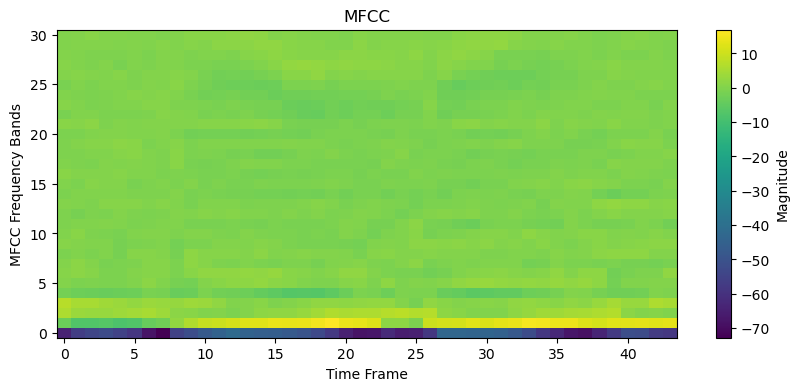

In [9]:
# Plotting the spectrogram
plt.figure(figsize=(10, 4))
plt.imshow(mfcc, aspect='auto', origin='lower', cmap='viridis')
plt.colorbar(label='Magnitude')
plt.xlabel('Time Frame')
plt.ylabel('MFCC Frequency Bands')
plt.title('MFCC')
plt.show()

### MFCC first derivative

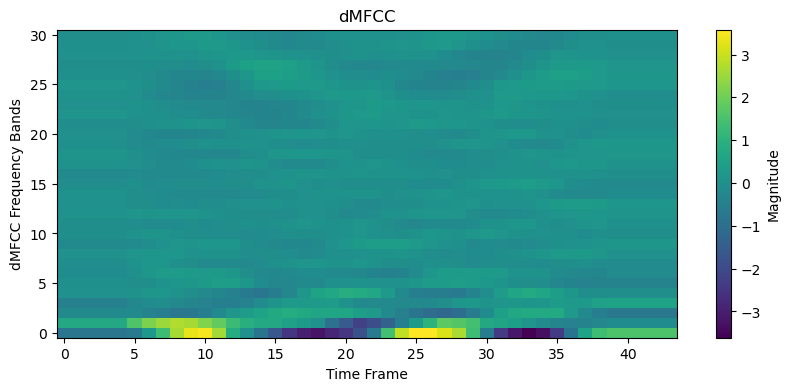

In [10]:
# Plotting the spectrogram
plt.figure(figsize=(10, 4))
plt.imshow(mfcc_d, aspect='auto', origin='lower', cmap='viridis')
plt.colorbar(label='Magnitude')
plt.xlabel('Time Frame')
plt.ylabel('dMFCC Frequency Bands')
plt.title('dMFCC')
plt.show()

### MFCC 2nd derivative

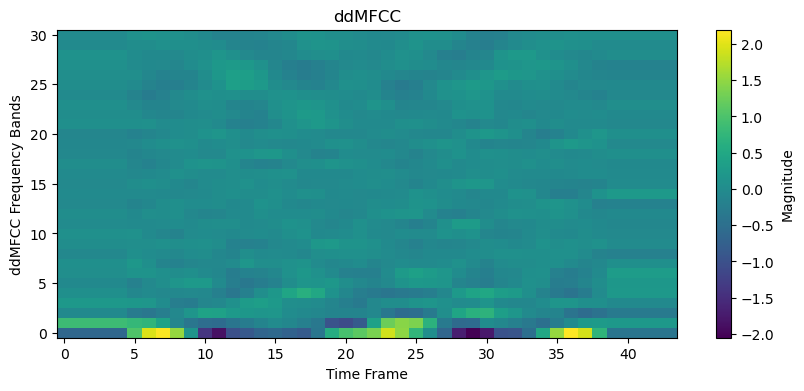

In [11]:
# Plotting the spectrogram
plt.figure(figsize=(10, 4))
plt.imshow(mfcc_d2, aspect='auto', origin='lower', cmap='viridis')
plt.colorbar(label='Magnitude')
plt.xlabel('Time Frame')
plt.ylabel('ddMFCC Frequency Bands')
plt.title('ddMFCC')
plt.show()

(63, 44)


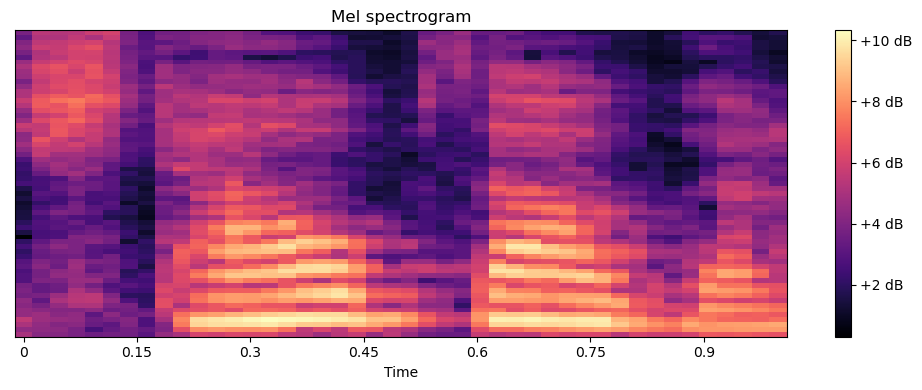

In [31]:
#BARIS
import librosa
#create spectrogram of data_melspec
sample = 2
data_melspec = data[sample, 12:75, :]
print(data_melspec.shape)
plt.figure(figsize=(10, 4))
librosa.display.specshow(data_melspec, x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel spectrogram')
plt.tight_layout()
plt.show()

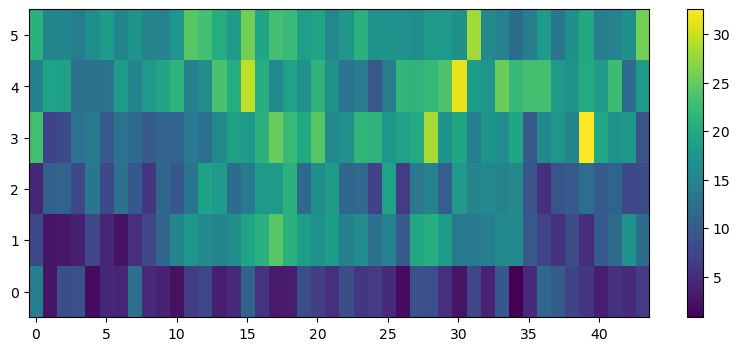

In [12]:
# Plotting the spectrogram
plt.figure(figsize=(10, 4))
contrast = range(2, 8)
plt.imshow(data[2, contrast, :], aspect='auto', origin='lower', cmap='viridis')
plt.colorbar(label='')
plt.show()

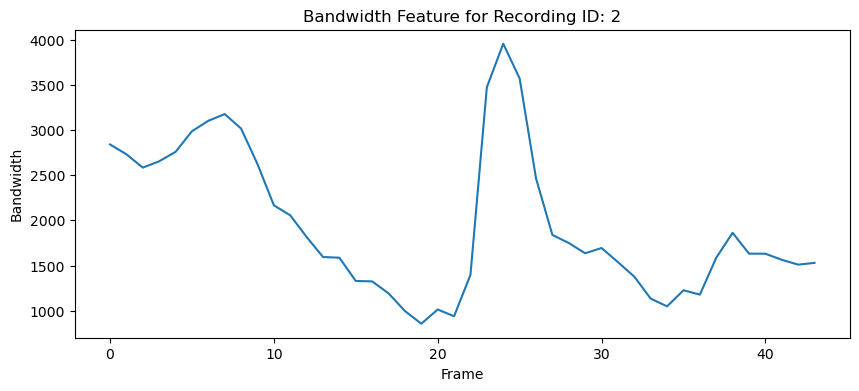

In [42]:
plt.figure(figsize=(10, 4))
bandwidth_feature = data[2, 0, :]
plt.plot(bandwidth_feature)
plt.title(f'Bandwidth Feature for Recording ID: {2}')
plt.xlabel('Frame')
plt.ylabel('Bandwidth')
plt.show()

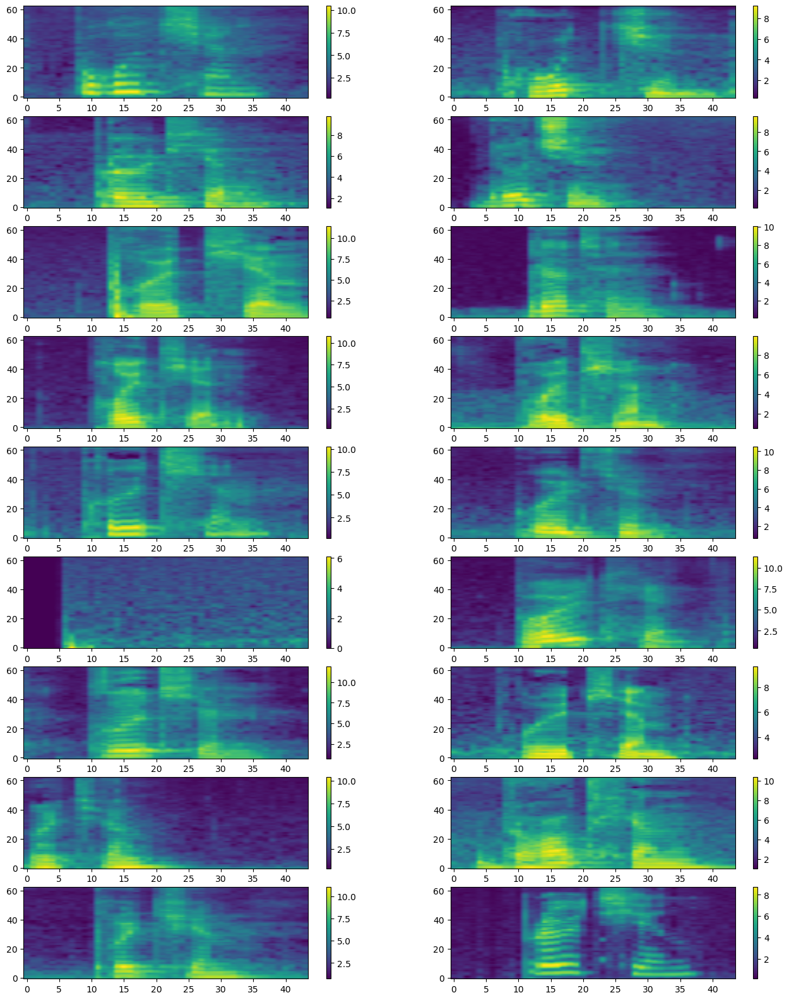

In [22]:
plt.figure(figsize=(16, 20))

img = 0
melspect = range(12, 75)

for i in brotchen_id[0:18]:
    img += 1
    plt.subplot(9, 2, img)
    plt.imshow(data[i, melspect, :], aspect='auto', origin='lower', cmap='viridis')
    plt.colorbar(label='')

plt.show()

### Word Aus

In [23]:
aus = labels_df[labels_df["word"] == "aus"]
unique_rows = aus.drop_duplicates(subset="speaker_id") # Prende ogni speaker una sola volta
aus_id = unique_rows["id"]

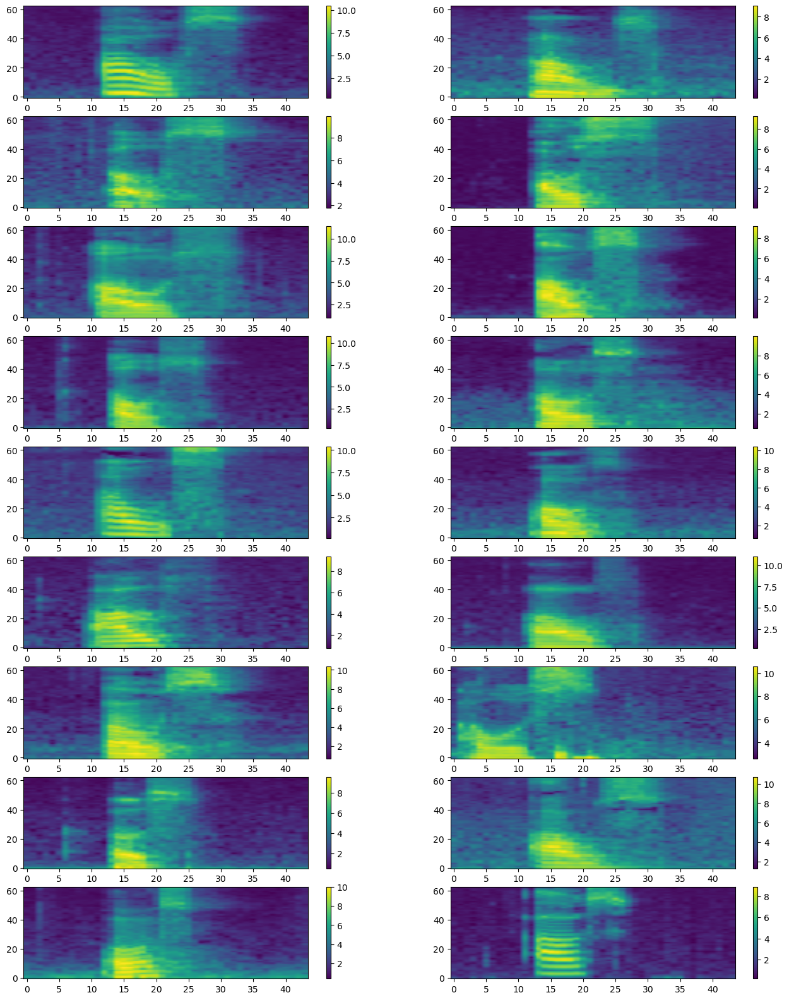

In [24]:
plt.figure(figsize=(16, 20))

img = 0
melspect = range(12, 75)

for i in aus_id[0:18]:
    img += 1
    plt.subplot(9, 2, img)
    plt.imshow(data[i, melspect, :], aspect='auto', origin='lower', cmap='viridis')
    plt.colorbar(label='')

plt.show()

# Splitting dataset

In [7]:
# Identify unique speakers
unique_speakers = labels_df['speaker_id'].unique()

In [104]:
unique_speakers

array([  1,   3,   5,   6,   7,   8,  10,  11,  12,  14,  16,  18,  19,
        22,  25,  26,  28,  30,  31,  33,  34,  35,  36,  37,  38,  39,
        41,  42,  43,  44,  45,  46,  50,  51,  53,  54,  57,  58,  59,
        60,  62,  64,  66,  69,  72,  73,  76,  81,  82,  83,  87,  89,
        90,  91,  93,  94,  95,  96,  97,  98,  99, 100, 101, 103, 105,
       107, 110, 111, 114, 115, 117, 118, 119, 120, 121, 122, 123, 124,
       125, 126, 127, 129, 130, 131, 132, 134, 135, 136, 137, 139, 140,
       141, 142, 143, 144, 146, 149, 150, 151, 152, 155, 157, 161, 162,
       163, 164, 165, 166, 168, 169, 171, 173, 175, 179, 183, 185, 186,
       187, 189, 190, 192, 193, 195, 196, 198, 199, 200, 201, 202, 203,
       204, 205, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 218,
       219, 220, 222, 223, 226, 227, 228, 229, 230, 233, 234, 235, 236,
       239, 240, 242, 243, 244, 245, 246, 248, 249, 250, 251, 253, 255,
       256, 225, 257], dtype=int64)

In [106]:
recordings_per_speaker = labels_df.groupby('speaker_id').size().reset_index(name='recording_count')
recordings_per_speaker

,speaker_id,recording_count
0,1,279
1,3,254
2,5,259
3,6,250
4,7,268
...,...,...
167,251,270
168,253,251
169,255,277
170,256,260


In [109]:
recordings_per_speaker["recording_count"].mean()

263.3488372093023

### Splitting code

In [9]:
from sklearn.model_selection import train_test_split
np.random.seed(42)
train_speakers, val_speakers = train_test_split(unique_speakers, test_size=0.3, random_state=42)

train_data = labels_df[labels_df['speaker_id'].isin(train_speakers)]
val_data = labels_df[labels_df['speaker_id'].isin(val_speakers)]


train_id = train_data["id"].values
train_set = data[train_id]

val_id = val_data["id"].values
validation_set = data[val_id]

In [105]:
train_data

,id,filename,speaker_id,word
0,0,words/Brötchen/1.wav,1,Brötchen
1,1,words/kann/1.wav,1,kann
2,2,words/Staubsauger/1.wav,1,Staubsauger
3,3,words/Spiegel/1.wav,1,Spiegel
4,4,words/Alarm/1.wav,1,Alarm
...,...,...,...,...
45291,45291,words/other/320_3_speech_true.wav,50,other
45292,45292,words/other/320_4_speech_true.wav,50,other
45293,45293,words/other/320_5_speech_true.wav,50,other
45294,45294,words/other/320_6_speech_true.wav,50,other


In [106]:
val_data

,id,filename,speaker_id,word
160,160,words/Brötchen/17.wav,5,Brötchen
161,161,words/kann/17.wav,5,kann
162,162,words/Staubsauger/17.wav,5,Staubsauger
163,163,words/Spiegel/17.wav,5,Spiegel
164,164,words/Alarm/17.wav,5,Alarm
...,...,...,...,...
45044,45044,words/other/1760_7_speech_true.wav,255,other
45045,45045,words/other/1760_8_speech_true.wav,255,other
45046,45046,words/other/1760_9_speech_true.wav,255,other
45047,45047,words/other/1760_10_speech_true.wav,255,other


In [107]:
# Checking that all the words are present in training data
def checking(word, train_data):

    # Filter the training data for the specific word
    word_data = train_data[train_data['word'] == word]

    # Check if there are any samples with the specific word
    if len(word_data) > 0:
        print(f"The word '{word}' is present in the training data.")
    else:
        print(f"The word '{word}' is not present in the training data.")

words = {"Fernseher", "Heizung", "Licht", "Lüftung", "Ofen", "Alarm", "Radio", "Staubsauger", "an", "aus"}
for i in words:
    checking(i, train_data)

The word 'Ofen' is present in the training data.
The word 'aus' is present in the training data.
The word 'Radio' is present in the training data.
The word 'Fernseher' is present in the training data.
The word 'Alarm' is present in the training data.
The word 'Heizung' is present in the training data.
The word 'Lüftung' is present in the training data.
The word 'an' is present in the training data.
The word 'Staubsauger' is present in the training data.
The word 'Licht' is present in the training data.


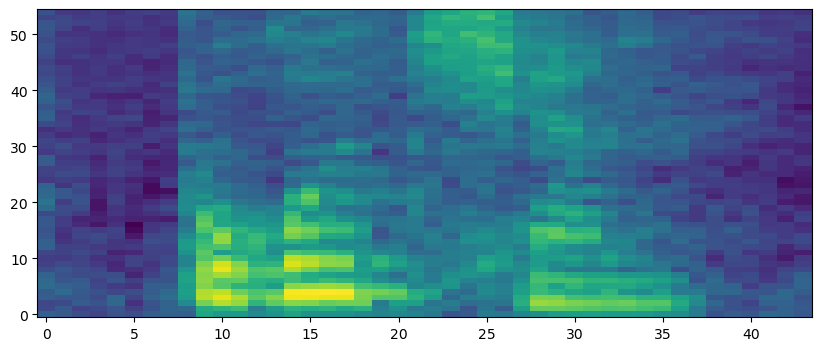

In [87]:
plt.figure(figsize=(10, 4))
plt.imshow(train_set[0,12:67,:], aspect='auto', origin='lower', cmap='viridis')

In [111]:
# Normalize the spectrogram
def normalize_spectrogram(spectrogram):
    if np.max(spectrogram) == 0:
        return spectrogram
    return (spectrogram - np.min(spectrogram)) / (np.max(spectrogram) - np.min(spectrogram))


### Create the new dataset of images

In [23]:
from PIL import Image
# Function to convert MFCC features to image arrays
def to_PIL_image(features):
    # Normalize the features
    features -= features.min()
    features /= features.max()
    features *= 255.0
    
    # Convert to uint8
    image_array = features.astype(np.uint8)
    
    # Convert to PIL image and back to array for keras
    image = Image.fromarray(image_array)
    #image = image.resize((64, 64))  # Resize if necessary
    return np.array(image)

image_arrays = np.array([to_PIL_image(sample[108:139, :]) for sample in train_set])

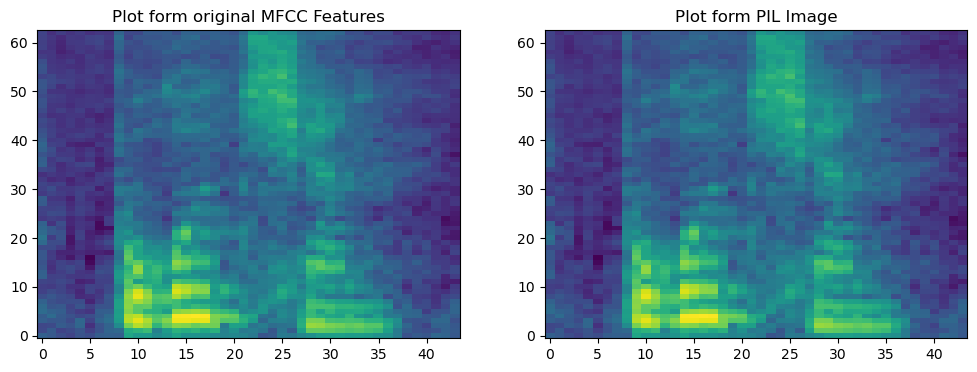

In [91]:
prova = to_PIL_image(train_set[0, 12:75, :])
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.imshow(train_set[0, 12:75, :], aspect='auto', origin='lower', cmap='viridis')
plt.title('Plot form original MFCC Features')

plt.subplot(1, 2, 2)
plt.title('Plot form PIL Image')
plt.imshow(prova, aspect='auto', origin='lower', cmap='viridis')


plt.imshow(train_set[0, 12:75, :], aspect='auto', origin='lower', cmap='viridis')

In [73]:
start_time = time.time()

image_arrays = np.array([to_PIL_image(sample[108:139, :]) for sample in train_set])

# Expand dimensions to match input shape of CNN (add a channel dimension)
image_arrays = np.expand_dims(image_arrays, axis=-1)

end_time = time.time()
t =  end_time - start_time
print("Time: ", t) 

Time:  1.6547150611877441


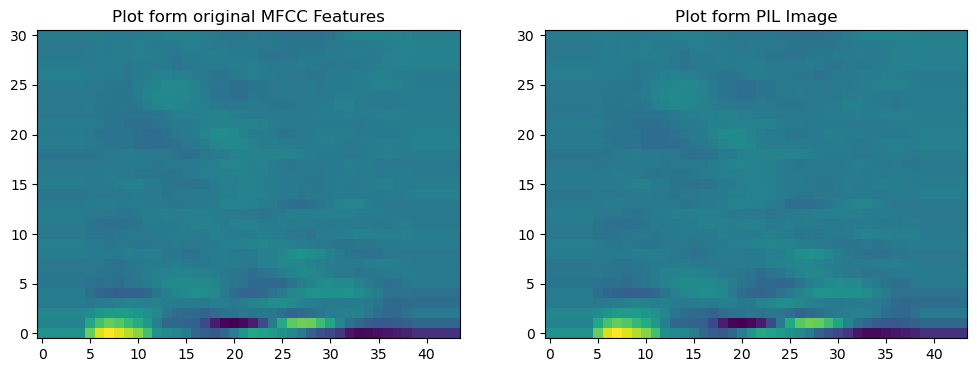

In [83]:
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.imshow(train_set[0, 108:139, :], aspect='auto', origin='lower', cmap='viridis')
plt.title('Plot form original MFCC Features')

plt.subplot(1, 2, 2)
plt.title('Plot form PIL Image')
plt.imshow(image_arrays[0], aspect='auto', origin='lower', cmap='viridis')

#### Create the dataset saving images in folders

In [ ]:
# Directory to save the images
base_dir = 'val_directory'
os.makedirs(base_dir, exist_ok=True)

# Initialize counter
counter = 0

for idx, row in val_data.iterrows():
    sample_id = row['id']
    label = row['word']
    
    # Create directory for the label if it doesn't exist
    label_dir = os.path.join(base_dir, label)
    os.makedirs(label_dir, exist_ok=True)
    
    # Get the spectrogram data
    sample_spectrogram = data[sample_id, 12:76, :]
    normalized_spectrogram = normalize_spectrogram(sample_spectrogram)
    
    # Save the spectrogram as an image
    filename = os.path.join(label_dir, f'spectrogram_{sample_id}.png')
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(sample_spectrogram, x_axis='time')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(filename, bbox_inches='tight', pad_inches=0)
    plt.close()
    

    counter += 1

    if counter % 500 == 0:
        print(f'{counter} images processed')
    

print(f'Total {counter} images processed')

500 images processed
1000 images processed
1500 images processed
2000 images processed
2500 images processed
3000 images processed
3500 images processed
4000 images processed
4500 images processed
5000 images processed


MemoryError: In RendererAgg: Out of memory

MemoryError: In RendererAgg: Out of memory

<Figure size 1000x400 with 1 Axes>

### Convert images to grayscale

In [155]:
from PIL import Image
import time

start_time = time.time()

def to_grayscale(pil_image: np.ndarray):
    
    image_copy = pil_image.copy()

    # Normalize the image to [0, 1] range
    grayscale_image = image_copy / 255

    # Colorimetric conversion to grayscale

    C_linear = np.where(grayscale_image <= 0.04045, grayscale_image / 12.92, ((grayscale_image + 0.055) / 1.055) ** 2.4)
    
    Y_linear = 0.2126 * C_linear[:,:,0] + 0.7152 * C_linear[:,:,1]+ 0.0722 * C_linear[:,:,2]
    Y = np.where(Y_linear <= 0.0031308, 12.92 * Y_linear, 1.055 * Y_linear ** (1/2.4) - 0.055)

    # Denormalize the grayscale image
    grayscale_image = Y * 255.0
    grayscale_image = grayscale_image.astype(pil_image.dtype) #Check if 

    # Add the brightness channel
    grayscale_image = np.expand_dims(grayscale_image, axis=0)
    
    return grayscale_image


def save_grayscale_image(image, file_path, output_dir, file):
    # Assicurati che l'array sia un numpy array
    image = np.asarray(image, dtype=np.uint8)

    # Rimuovi la dimensione del canale se presente
    if image.shape[0] == 1:
        image = np.squeeze(image, axis=0)

    # Crea l'immagine PIL
    image = Image.fromarray(image) 

    # Salva l'immagine
    folder = file.split("\\")[-2]
    folder = os.path.join(output_dir, folder)
    # Create the new folder if it doesn't exist
    if not os.path.exists(folder):
        os.makedirs(folder)
        
    name = os.path.basename(file)
    output_dir = os.path.join(folder, name)
    image.save(output_dir)


input_dir = r"C:\Users\miche.LAPTOP-KKEENNGV\OneDrive\Desktop\JKU\Machine Learning and pattern classification\UE\Task 3 - Classification\train_directory"
output_dir = r"C:\Users\miche.LAPTOP-KKEENNGV\OneDrive\Desktop\JKU\Machine Learning and pattern classification\UE\Task 3 - Classification\train_grayscale"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
files =[]
input_dir = os.path.abspath(input_dir)
for folder, subfolder, file in os.walk(input_dir):
    for f in file:
        files.append(os.path.join(folder, f))

for file in files:
    my_image = Image.open(file)
    pil_image = np.array(my_image)
    image = to_grayscale(pil_image)
    save_grayscale_image(image, input_dir, output_dir, file)

#To print the new b&w image
#image_copy = image
#image_copy = np.squeeze(image_copy)
#bw_pil_image = Image.fromarray(image_copy)


end_time = time.time()
execution_time = end_time - start_time
print("Execution time:", execution_time, "seconds")

Execution time: 2692.9150795936584 seconds


# Naive classifier

In [165]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

In [166]:
nb_classifier = GaussianNB()
nb_classifier.fit(X_train, y_train)
pred_test_navie = nb_classifier.predict(X_test)
pred_train_navie = nb_classifier.predict(X_train)

In [168]:
accuracy_naive_train = accuracy_score(y_train, pred_train_navie)
accuracy_naive_test = accuracy_score(y_validation, pred_test_navie)

print("Accuracy:", accuracy_naive_train)
print("Accuracy:", accuracy_naive_test)

print("Classification Report:")
print(classification_report(y_validation, pred_test_navie))

Accuracy: 0.46787851776391187
Accuracy: 0.4606021319504466
Classification Report:
              precision    recall  f1-score   support

       Alarm       0.45      0.37      0.41       622
    Brötchen       0.06      0.00      0.00       622
   Fernseher       0.31      0.45      0.37       624
        Haus       0.74      0.60      0.66       624
     Heizung       0.47      0.41      0.44       620
     Leitung       0.54      0.41      0.47       623
       Licht       0.65      0.37      0.47       624
     Lüftung       0.45      0.43      0.44       623
        Ofen       0.35      0.63      0.45       624
       Radio       0.50      0.37      0.43       624
    Schraube       0.64      0.67      0.65       623
     Spiegel       0.52      0.75      0.62       624
 Staubsauger       0.43      0.66      0.52       620
          an       0.25      0.66      0.37       624
         aus       0.74      0.58      0.65       623
        kann       0.04      0.03      0.03       621

# Random forest

## Preprocessing data

In [87]:
#MELSPCET
train = train_set[:, 12:75,:]
validation = validation_set[:, 12:75, :]

#MFCC d
#train = train_set[:, 108:139,:]
#validation = validation_set[:, 108:139, :]

#MFCC d2
#train = train_set[:, 140:171,:]
#validation = validation_set[:, 140:171, :]

In [173]:
train_save = train
validation_save = validation

In [174]:
min_value = np.min(train)
max_value = np.max(train)
train = (train - min_value) / (max_value - min_value)

min_value = np.min(validation)
max_value = np.max(validation)
validation = (validation - min_value) / (max_value - min_value)

In [88]:
y_train = train_data["word"]
y_validation = val_data["word"]

In [175]:
#Reshape Training set
n_samples = train.shape[0]
n_features = train.shape[1] * train.shape[2]  # 63 * 44
X_train = train.reshape(n_samples, n_features)
print("Train data:", train.shape)
print("Reshape train data:", X_train.shape)

# Reshape Validation Set
n_samples = validation.shape[0]
n_features = validation.shape[1] * validation.shape[2]  # 63 * 44
X_test = validation.reshape(n_samples, n_features)
print("Test data: ", validation.shape)
print("Reshape test data: ", X_test.shape)

Train data: (31412, 63, 44)
Reshape train data: (31412, 2772)
Test data:  (13884, 63, 44)
Reshape test data:  (13884, 2772)


## Build the model

In [105]:
model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)

## Fit the model

In [106]:
model.fit(X_train, y_train)

RandomForestClassifier(max_depth=10, random_state=42)

### Accuracy training

In [109]:
pred_train = model.predict(X_train)
train_accuracy = accuracy_score(y_train, pred_train)
print("Accuracy:", train_accuracy)

Accuracy: 0.885330446962944


### Recall training

Senza specificare l'opzione average: In questo caso, verrà restituito un array con la recall di ciascuna classe. Questo è utile se vuoi valutare la recall per ogni classe separatamente:

    recall = recall_score(y_train, pred_train, average=None)

Specificando l'opzione average come micro, macro, weighted o samples: In questo caso, verrà calcolata una singola metrica di recall considerando le diverse classi del problema.
- 'micro': Calcola la recall globale considerando le singole previsioni e verità di ogni campione.
- 'macro': Calcola la media non ponderata della recall per ogni classe. Ogni classe contribuisce con lo stesso peso indipendentemente dalla sua dimensione.
- 'weighted': Calcola la media ponderata della recall per ogni classe, pesata in base al supporto di ciascuna classe.
- 'samples': Calcola la recall per ogni campione e quindi ne fa la media.

In [127]:
recall = recall_score(y_train, pred_train, average='micro')
print("Recall:", recall)

Recall: 0.885330446962944


In [146]:
#Comparison first 50 prediction with real class
for i in range(0, 50):
    print(pred_train[i], y_train[i])

Brötchen Brötchen
kann kann
Staubsauger Staubsauger
Spiegel Spiegel
Alarm Alarm
Lüftung Lüftung
Ofen Ofen
Haus Haus
Heizung Heizung
Fernseher Fernseher
Ofen Ofen
Schraube Schraube
Spiegel Spiegel
Lüftung Brötchen
Licht Licht
kann kann
Staubsauger Staubsauger
Spiegel Spiegel
Brötchen Brötchen
Lüftung Lüftung
aus aus
Haus Haus
Licht nicht
warm warm
Schraube Schraube
Haus Haus
Schraube Schraube
kann kann
Alarm warm
nicht nicht
Heizung Heizung
aus aus
an an
Lüftung Lüftung
Leitung Leitung
offen offen
Haus Haus
Lüftung Lüftung
offen offen
warm warm
wunderbar wunderbar
Licht Licht
Ofen Ofen
Leitung Leitung
aus aus
Alarm Alarm
offen offen
Fernseher Fernseher
kann kann
Ofen Ofen
wunderbar wunderbar
warm Radio
Licht Licht
Fernseher Fernseher
Staubsauger Staubsauger
warm warm
warm Radio
Heizung Heizung
Staubsauger Staubsauger
Radio Radio
Schraube Schraube
Fernseher Fernseher
Alarm Alarm
Spiegel Spiegel
Alarm Alarm
Heizung Heizung
aus aus
Brötchen Brötchen
wunderbar wunderbar
Leitung Leitung
Lich

## Prediction

In [134]:
pred = model.predict(X_test)
test_accuracy = accuracy_score(y_validation, pred)
print("Accuracy:", test_accuracy)
test_recall = recall_score(y_validation, pred, average='micro')
print("Recall:", test_recall)

Accuracy: 0.7751368481705561
Recall: 0.7751368481705561


In [147]:
#Comparison first 50 prediction with real class
j = 0
for i in y_validation:
    print(pred[j], i)
    j +=1

Brötchen Brötchen
kann kann
Staubsauger Staubsauger
Spiegel Spiegel
Alarm Alarm
Lüftung Lüftung
Ofen Ofen
Haus Haus
Heizung Heizung
Fernseher Fernseher
Ofen Ofen
Schraube Schraube
Spiegel Spiegel
Lüftung Brötchen
Licht Licht
kann kann
Staubsauger Staubsauger
Spiegel Spiegel
Brötchen Brötchen
Lüftung Lüftung
aus aus
Haus Haus
Licht nicht
warm warm
Schraube Schraube
Haus Haus
Schraube Schraube
kann kann
Alarm warm
nicht nicht
Heizung Heizung
aus aus
an an
Lüftung Lüftung
Leitung Leitung
offen offen
Haus Haus
Lüftung Lüftung
offen offen
warm warm
wunderbar wunderbar
Licht Licht
Ofen Ofen
Leitung Leitung
aus aus
Alarm Alarm
offen offen
Fernseher Fernseher
kann kann
Ofen Ofen
wunderbar wunderbar
warm Radio
Licht Licht
Fernseher Fernseher
Staubsauger Staubsauger
warm warm
warm Radio
Heizung Heizung
Staubsauger Staubsauger
Radio Radio
Schraube Schraube
Fernseher Fernseher
Alarm Alarm
Spiegel Spiegel
Alarm Alarm
Heizung Heizung
aus aus
Brötchen Brötchen
wunderbar wunderbar
Leitung Leitung
Lich

## Experiment on other features

### MFCC

In [151]:
train_set = data[train_id]
validation_set = data[val_id]

train_set = train_set[:, 76:107,:]
validation_set = validation_set[:, 76:107, :]

y_train = train_data["word"]
y_validation = val_data["word"]

#Reshape Training set
n_samples = train_set.shape[0]
n_features = train_set.shape[1] * train_set.shape[2]  # 63 * 44
X_train = train_set.reshape(n_samples, n_features)

# Reshape Validation Set
n_samples = validation_set.shape[0]
n_features = validation_set.shape[1] * validation_set.shape[2]  # 63 * 44
X_test = validation_set.reshape(n_samples, n_features)

model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)

#TRAINING
model.fit(X_train, y_train)
pred_train = model.predict(X_train)
train_accuracy = accuracy_score(y_train, pred_train)
print("Accuracy training:", train_accuracy)
recall_train = recall_score(y_train, pred_train, average='micro')
print("Recall training:", recall)

#TEST
pred_test = model.predict(X_test)
test_accuracy = accuracy_score(y_validation, pred_test)
print("Accuracy test:", test_accuracy)
test_recall = recall_score(y_validation, pred_test, average='micro')
print("Recall test:", test_recall)

Accuracy training: 0.9227046988412072
Recall training: 0.885330446962944
Accuracy test: 0.8041630653990205
Recall test: 0.8041630653990205


### MFCC d

In [152]:
train_set = data[train_id]
validation_set = data[val_id]

train_set = train_set[:, 108:139,:]
validation_set = validation_set[:, 108:139, :]

y_train = train_data["word"]
y_validation = val_data["word"]

#Reshape Training set
n_samples = train_set.shape[0]
n_features = train_set.shape[1] * train_set.shape[2]  # 63 * 44
X_train = train_set.reshape(n_samples, n_features)

# Reshape Validation Set
n_samples = validation_set.shape[0]
n_features = validation_set.shape[1] * validation_set.shape[2]  # 63 * 44
X_test = validation_set.reshape(n_samples, n_features)

model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)

#TRAINING
model.fit(X_train, y_train)
pred_train = model.predict(X_train)
train_accuracy = accuracy_score(y_train, pred_train)
print("Accuracy training:", train_accuracy)
recall_train = recall_score(y_train, pred_train, average='micro')
print("Recall training:", recall)

#TEST
pred_test = model.predict(X_test)
test_accuracy = accuracy_score(y_validation, pred_test)
print("Accuracy test:", test_accuracy)
test_recall = recall_score(y_validation, pred_test, average='micro')
print("Recall test:", test_recall)

Accuracy training: 0.9402457659493187
Recall training: 0.885330446962944
Accuracy test: 0.8434889080956497
Recall test: 0.8434889080956497


### MFCC d2

In [153]:
train_set = data[train_id]
validation_set = data[val_id]

train_set = train_set[:, 140:171,:]
validation_set = validation_set[:, 140:171, :]

y_train = train_data["word"]
y_validation = val_data["word"]

#Reshape Training set
n_samples = train_set.shape[0]
n_features = train_set.shape[1] * train_set.shape[2]  # 63 * 44
X_train = train_set.reshape(n_samples, n_features)

# Reshape Validation Set
n_samples = validation_set.shape[0]
n_features = validation_set.shape[1] * validation_set.shape[2]  # 63 * 44
X_test = validation_set.reshape(n_samples, n_features)

model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)

#TRAINING
model.fit(X_train, y_train)
pred_train = model.predict(X_train)
train_accuracy = accuracy_score(y_train, pred_train)
print("Accuracy training:", train_accuracy)
recall_train = recall_score(y_train, pred_train, average='micro')
print("Recall training:", recall)

#TEST
pred_test = model.predict(X_test)
test_accuracy = accuracy_score(y_validation, pred_test)
print("Accuracy test:", test_accuracy)
test_recall = recall_score(y_validation, pred_test, average='micro')
print("Recall test:", test_recall)

Accuracy training: 0.894880937221444
Recall training: 0.885330446962944
Accuracy test: 0.798040910400461
Recall test: 0.798040910400461


## Hyperparameter tuning

In [90]:
from sklearn.model_selection import GridSearchCV

# Definisci la griglia dei parametri da esplorare
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10]
}

# Inizializza il modello
model = RandomForestClassifier(random_state=42)

# Crea un oggetto GridSearchCV
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs = -1, verbose=2)

# Esegui la ricerca grid sui dati di addestramento
grid_search.fit(X_train, y_train)

# Visualizza i migliori parametri trovati
print("Best hyperparameters:", grid_search.best_params_)

# Valuta il modello con i migliori parametri
accuracy = grid_search.best_estimator_.score(X_test, y_validation)
print("Accuracy:", accuracy)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best hyperparameters: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 300}
Accuracy: 0.8331172572745607


In [118]:
print("Best hyperparameters:", grid_search.best_params_)
accuracy = grid_search.best_estimator_.score(X_test, y_validation)
print("Accuracy:", accuracy)

Best hyperparameters: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 300}
Accuracy: 0.8331172572745607


In [129]:
cv_results = pd.DataFrame(grid_search.cv_results_)
# Display a summary of the results
print(cv_results[['mean_test_score', 'std_test_score', 'params']])

    mean_test_score  std_test_score  \
0          0.874794        0.010690   
1          0.881192        0.010399   
2          0.882625        0.010921   
3          0.873297        0.010813   
4          0.878359        0.011166   
5          0.880460        0.011391   
6          0.869318        0.010712   
7          0.874825        0.010715   
8          0.876003        0.010928   
9          0.792468        0.011454   
10         0.796734        0.012243   
11         0.799249        0.012438   
12         0.792341        0.012890   
13         0.797275        0.012191   
14         0.798899        0.012190   
15         0.791959        0.010327   
16         0.795174        0.012144   
17         0.797848        0.012804   
18         0.873393        0.010599   
19         0.879282        0.011294   
20         0.880842        0.011034   
21         0.872374        0.010277   
22         0.877659        0.010787   
23         0.880046        0.010899   
24         0.868204      

In [ ]:
results = pd.DataFrame(grid_search.cv_results_)

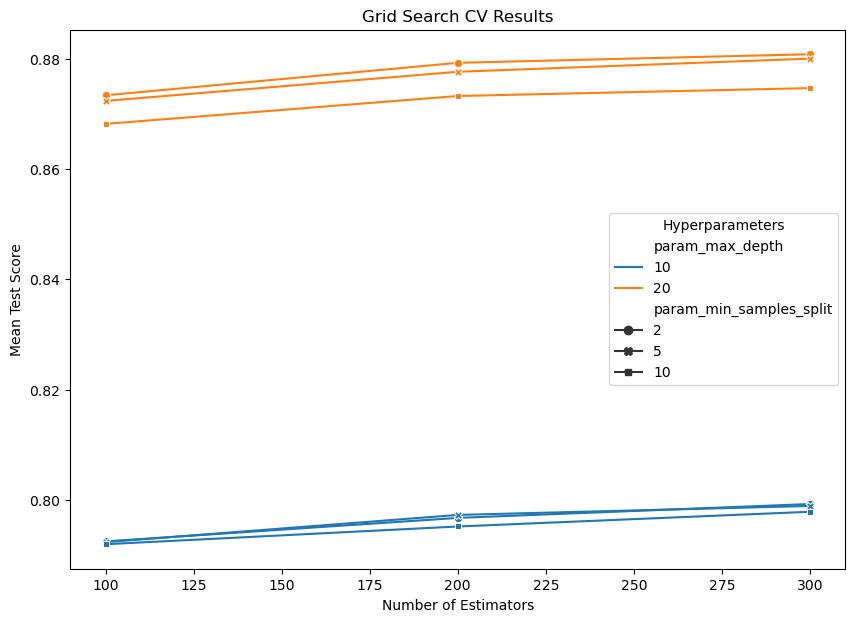

In [148]:
# Plotting performance change with different n_estimators
plt.figure(figsize=(10, 7))
sns.lineplot(data=results, x='param_n_estimators', y='mean_test_score', hue='param_max_depth', style='param_min_samples_split', markers=True, dashes=False)
plt.title("Grid Search CV Results")
plt.xlabel("Number of Estimators")
plt.ylabel("Mean Test Score")
plt.legend(title='Hyperparameters')
plt.savefig('grid_search_results.png')
plt.show()

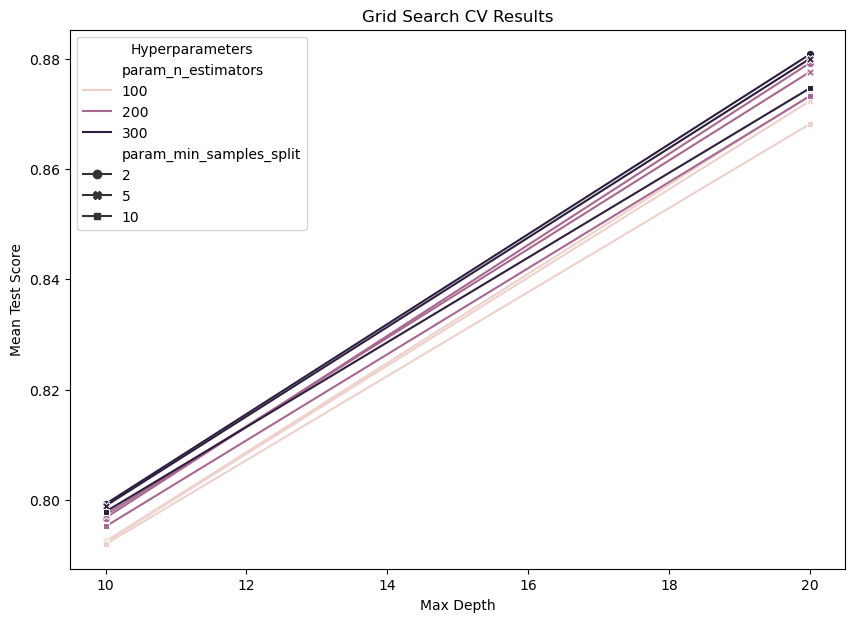

In [149]:
# Plotting performance change with different max_depth
plt.figure(figsize=(10, 7))
sns.lineplot(data=results, x='param_max_depth', y='mean_test_score', hue='param_n_estimators', style='param_min_samples_split', markers=True, dashes=False)
plt.title("Grid Search CV Results")
plt.xlabel("Max Depth")
plt.ylabel("Mean Test Score")
plt.legend(title='Hyperparameters')
plt.savefig('grid_search_results_max_depth.png')
plt.show()

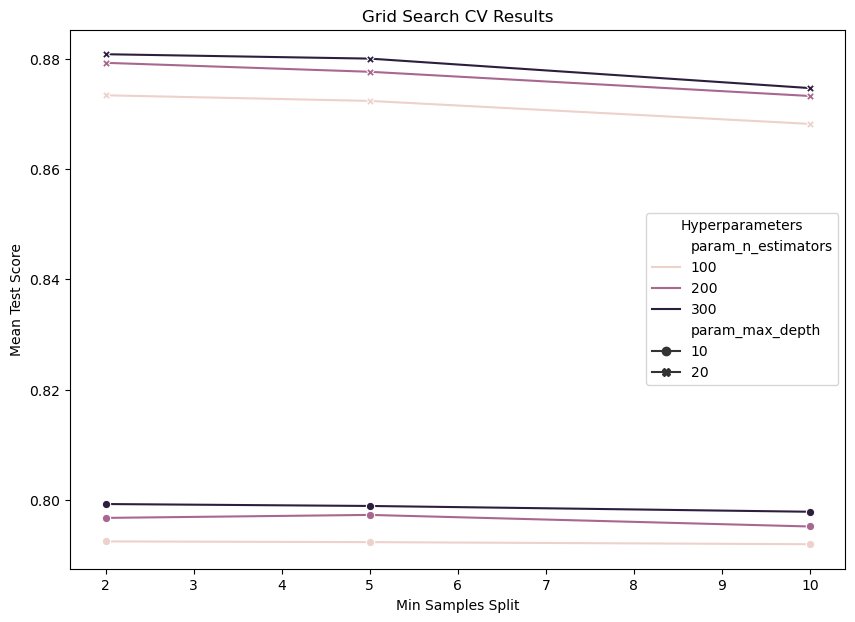

In [150]:
# Plotting performance change with different min_samples_split
plt.figure(figsize=(10, 7))
sns.lineplot(data=results, x='param_min_samples_split', y='mean_test_score', hue='param_n_estimators', style='param_max_depth', markers=True, dashes=False)
plt.title("Grid Search CV Results")
plt.xlabel("Min Samples Split")
plt.ylabel("Mean Test Score")
plt.legend(title='Hyperparameters')
plt.savefig('grid_search_results_min_samples_split.png')

plt.show()

## Best model

In [177]:
# MEL SPECTOGRAM
start = time.time()

model = RandomForestClassifier(n_estimators=300, max_depth=None, min_samples_split=2, random_state=42)
model.fit(X_train, y_train)
pred_train = model.predict(X_train)
pred_test = model.predict(X_test)
train_accuracy = accuracy_score(y_train, pred_train)
print("Accuracy train accuracy (Mel Spect):", train_accuracy)
test_accuracy = accuracy_score(y_validation, pred_test)
print("Accuracy test (Mel Spect):", test_accuracy)

end = time.time()
t = end - start
print("Computation time: ", t)

Accuracy train accuracy (Mel Spect): 0.9975805424678467
Accuracy test (Mel Spect): 0.06273408239700375
Computation time:  750.306232213974


In [176]:
print("Accuracy train accuracy (Mel Spect not normalize):", train_accuracy)
print("Accuracy test (Mel Spect not normalize):", test_accuracy)

Accuracy train accuracy (Mel Spect not normalize): 0.9975805424678467
Accuracy test (Mel Spect not normalize): 0.8331172572745607


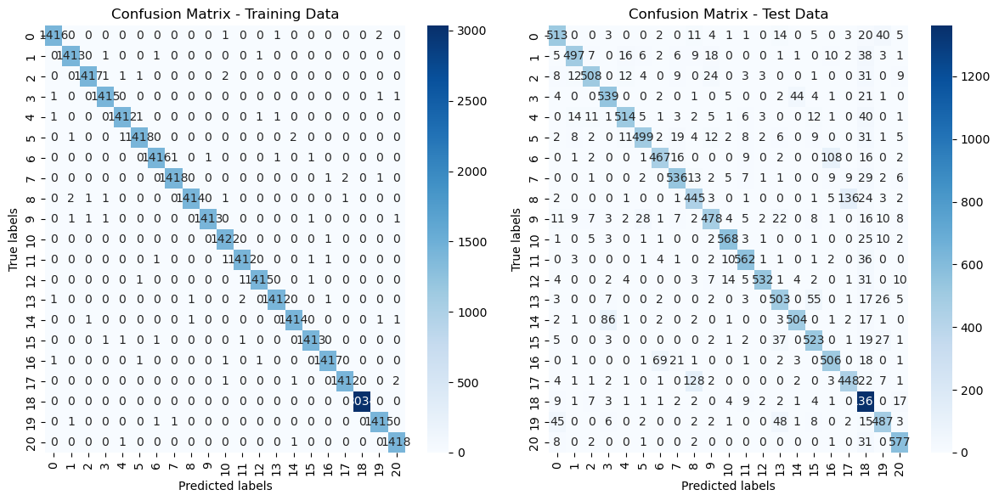

In [154]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Calculate the confusion matrix for training data
cm_train = confusion_matrix(y_train, pred_train)

# Calculate the confusion matrix for test data
cm_test = confusion_matrix(y_validation, pred_test)

# Plot the confusion matrices
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Plot for training data
sns.heatmap(cm_train, annot=True, cmap='Blues', fmt='g', ax=ax[0])
ax[0].set_title('Confusion Matrix - Training Data')
ax[0].set_xlabel('Predicted labels')
ax[0].set_ylabel('True labels')

# Plot for test data
sns.heatmap(cm_test, annot=True, cmap='Blues', fmt='g', ax=ax[1])
ax[1].set_title('Confusion Matrix - Test Data')
ax[1].set_xlabel('Predicted labels')
ax[1].set_ylabel('True labels')
plt.savefig('confusion_matrix_melspect.png')

plt.tight_layout()
plt.show()


In [50]:
# MFCC d
start = time.time()

model = RandomForestClassifier(n_estimators=300, max_depth=None, min_samples_split=2, random_state=42)
model.fit(X_train, y_train)
pred_test = model.predict(X_test)
test_accuracy_mfccd = accuracy_score(y_validation, pred_test)
print("Accuracy test (MFCCd):", test_accuracy)

end = time.time()
t = end - start
print("Computation time: ", t)

Accuracy test (MFCC): 0.8774848746758859


In [56]:
# MFCC d2
start = time.time()
#Probably this is the best model for MFCC d2
model = RandomForestClassifier(n_estimators=300, max_depth=None, min_samples_split=2, random_state=42)
model.fit(X_train, y_train)
pred_test = model.predict(X_test)
test_accuracy_mfccd2 = accuracy_score(y_validation, pred_test)
print("Accuracy test (MFCCd2):", test_accuracy)

end = time.time()
t = end - start
print("Computation time: ", t)

Accuracy test (MFCCd2): 0.8774848746758859
Computation time:  488.9014666080475


#### Randomized Search CV (bad)

In [272]:
prove = round(X_train.shape[0]*0.3)
X_train2 = X_train[0:prove, :]
y_train2= y_train[0:prove]

In [273]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

start_time = time.time()

# Definisci la distribuzione dei parametri da esplorare
param_dist = {
    'n_estimators': randint(100, 1000),
    'max_depth': [None] + list(randint(5, 50).rvs(10)),
    'min_samples_split': randint(2, 20)
}

# Inizializza il modello
model = RandomForestClassifier(random_state=42)

# Crea un oggetto RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_dist, n_iter=100, cv=5, random_state=42, n_jobs=-1, verbose=2)

# Esegui la ricerca casuale sui dati di addestramento
random_search.fit(X_train2, y_train2)

# Visualizza i migliori parametri trovati
print("Migliori parametri:", random_search.best_params_)

# Valuta il modello con i migliori parametri
accuracy = random_search.best_estimator_.score(X_test, y_test)
print("Accuratezza:", accuracy)

end_time = time.time()
execution_time = end_time - start_time
print("Execution time:", execution_time, "seconds")

Fitting 5 folds for each of 100 candidates, totalling 500 fits


KeyboardInterrupt: 

# CNN

In [ ]:
images_arrays

# Test set

In [167]:
# Load the .npy file
test1 = np.load("2_Florian_Heizung_aus.npy")
test2 = np.load("3_Verena_Staubsauger_an_Alarm_an.npy")
test3 = np.load("5_Lukas_Staubsauger_an_Licht_aus.npy")
test4 = np.load("6_Deepak_Radio_aus_Licht_aus.npy")

def testing(test, h, w):
    test_set = []
    for i in range(0, (test.shape[2]+1)-w, h):
        j = i + w
        test_set.append(test[:, :,i:j])
    return test_set

test_set1 = testing(test1, 5, 44)

In [169]:
print(test1.shape)
print(test2.shape)
print(test3.shape)
print(test4.shape)

(1, 175, 854)
(1, 175, 762)
(1, 175, 292)
(1, 175, 243)


In [235]:
def testing(test, h, w):
    test_set = []
    for i in range(0, (test.shape[2]+1)-w, h):
        j = i + w
        test_set.append(test[:, :,i:j])
    return test_set

In [236]:
test_set1 = testing(test1, 5, 44)


In [237]:
len(test_set1)

163

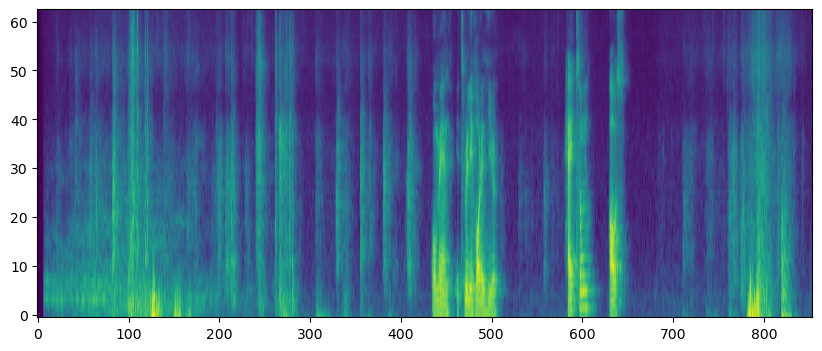

In [214]:
# Plot of one recording
plt.figure(figsize=(10, 4))
plt.imshow(test1[0,12:75,:], aspect='auto', origin='lower', cmap='viridis')

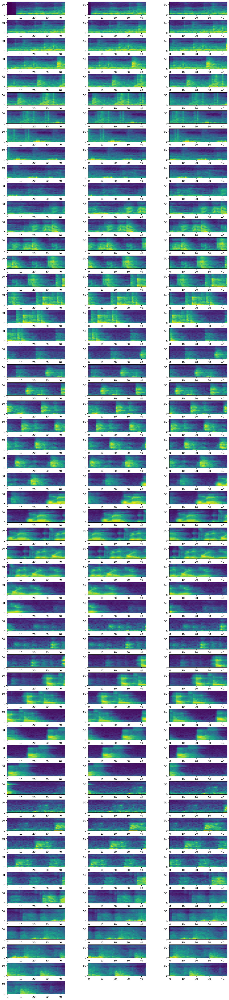

In [245]:
#Plot of the windows of the recording
plt.figure(figsize=(15, 200))

img = 0

for rec in test_set1:
    img += 1
    plt.subplot(len(test_set1), 3, img)
    plt.imshow(rec[0,12:76,:], aspect='auto', origin='lower', cmap='viridis')
    plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=0.4, hspace=0.4)
    
plt.show()